# Image Stitching (Panorama completion)

We shall merge two images to form the panorama depicted as follows. We shall mainly use OpenCV with Python and Matplotlib to do this.

In [1]:
import cv2
cv2.__version__

'3.4.4'

In [4]:
import numpy as np
import matplotlib.pyplot as plt

AttributeError: module 'matplotlib.pyplot' has no attribute 'plt'

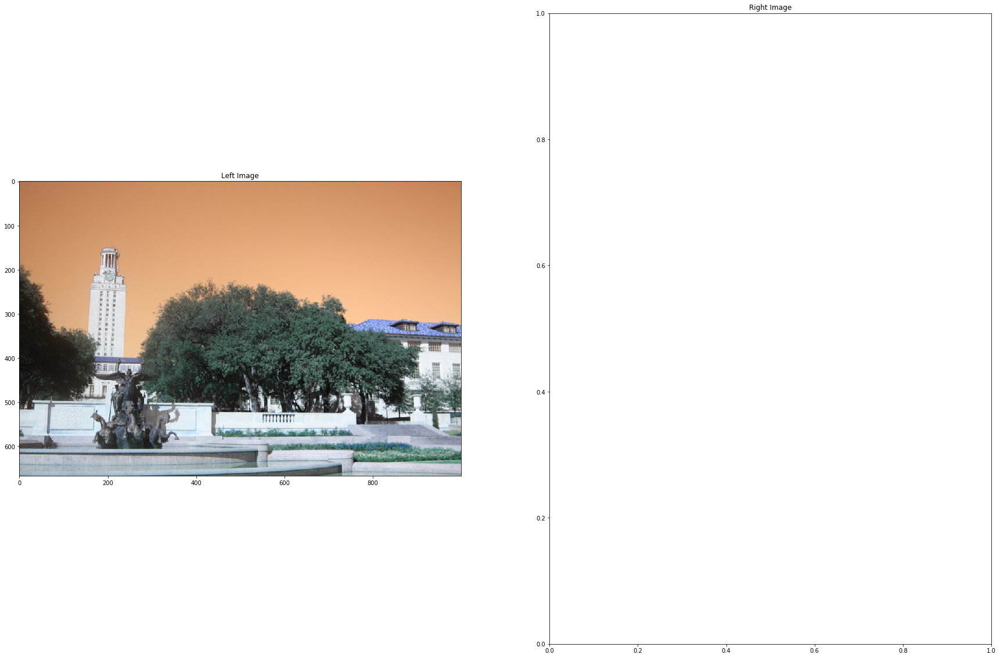

In [12]:
#Read the right and left images
img_right = cv2.imread('/cxldata/projects/uttower_right.jpg')
img_left = cv2.imread('/cxldata/projects/uttower_left.jpg')

#Display both the left and right images side-by-side
plt.figure(figsize=(30,20))

plt.subplot(1,2,1)
plt.title("Left Image")
plt.imshow(img_left)

plt.subplot(1,2,2)
plt.title("Right Image")
plt.plt.imshow(img_right)

plt.tight_layout()


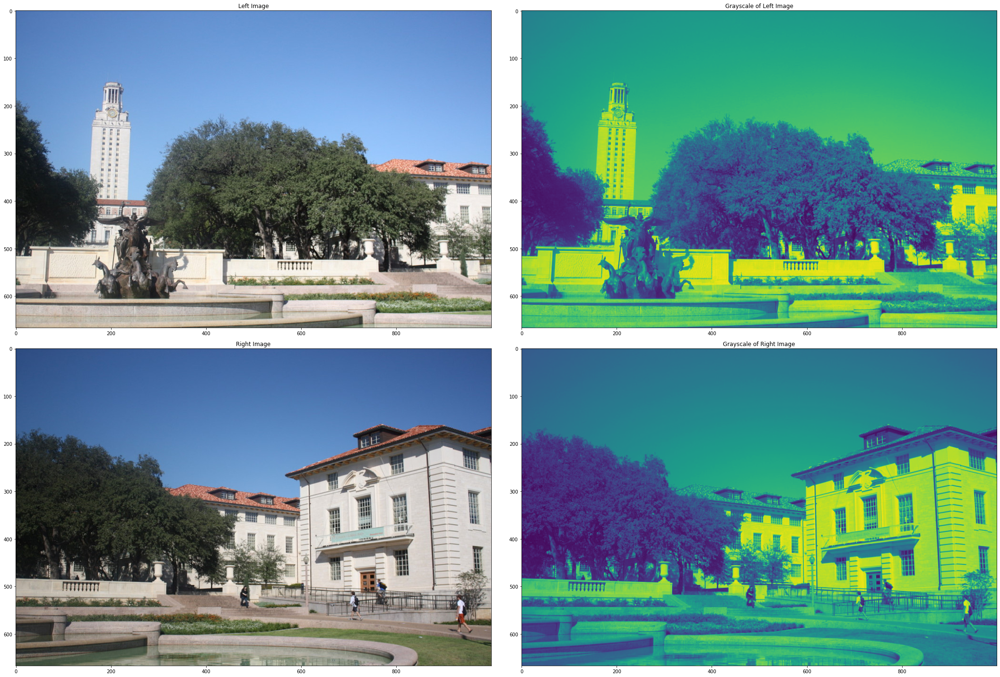

In [18]:
#Define fixColor function which takes an image as the input argument ad returns the RGB format of the image.
def fixColor(image):
    return(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

#Now, convert the img_right and img_left images into grayscale format
img1 = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img_left , cv2.COLOR_BGR2GRAY)

#We shall use fixColor to display the image in RGB format
plt.figure(figsize=(30,20))

plt.subplot(2,2,1)
plt.title("Left Image")
plt.imshow(fixColor(img_left))
plt.subplot(2,2,2)
plt.title("Grayscale of Left Image")
plt.imshow(img2)

plt.subplot(2,2,3)
plt.title("Right Image")
plt.imshow(fixColor(img_right))
plt.subplot(2,2,4)
plt.title("Grayscale of Right Image")
plt.imshow(img1)

plt.tight_layout()


In [25]:
#We should first find out the matching image features between both of them, so that we could stitch them based on these features.

#Image features are small patches that are useful to compute similarities between images
orb = cv2.ORB_create()
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

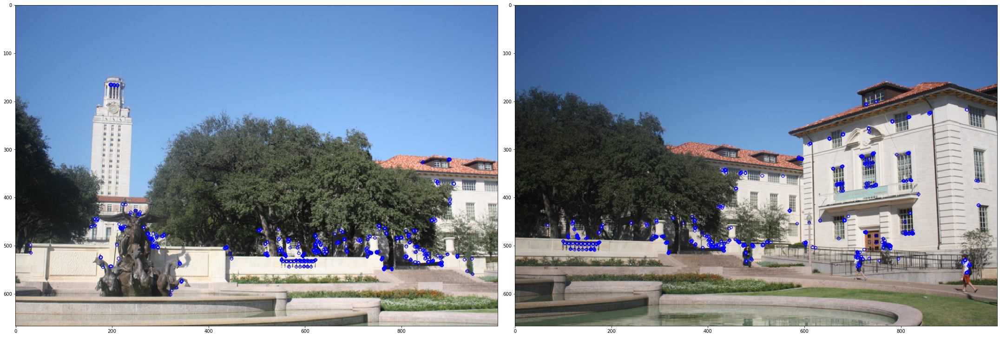

In [45]:
#Visualizing Key-Points on the Images
img_right_kp = cv2.drawKeypoints(img_right,kp1, np.array([]), color=(255,0,0))
img_left_kp = cv2.drawKeypoints(img_left, kp2,np.array([]),color=(255,0,0))

#Visualize the img_left_kp and img_right_kp side-by-side.
plt.figure(figsize=(30,20))
plt.subplot(1,2,1)
plt.imshow(fixColor(img_left_kp ))

plt.subplot(1,2,2)
plt.imshow(fixColor(img_right_kp ))
plt.tight_layout()

In [58]:
#The obtained descriptors in one image are to be recognized in the other image too. This is because, once the matching features are recognized, the images could be stitched based on these matching features.

#Brute-Force matcher(cv2.BFMatcher())-It takes the descriptor of one feature in the first set and is matched with all other features in the second set using some distance calculation. And the closest one is returned.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1,des2)
#matches is a list of DMatch objects
matches = sorted(matches, key = lambda x:x.distance)


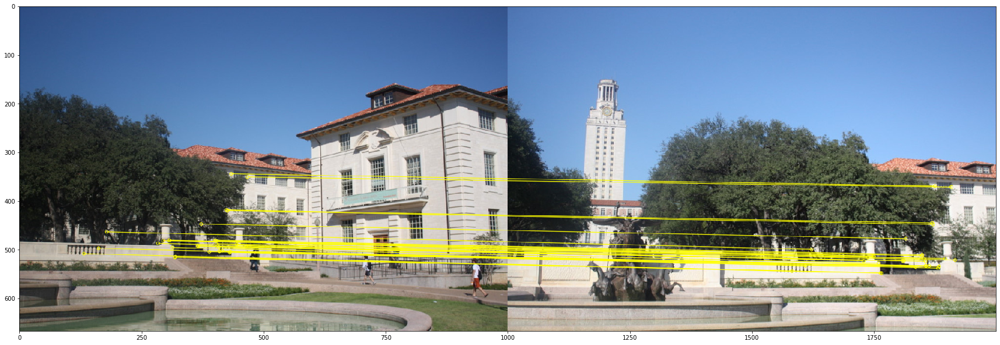

In [71]:
#From all the keypoints extracted by the BFMatcher, let us plot and view 30 of the best common key-points between the left and right images.
draw_params = dict(matchColor = (255,255,0),flags = 2)  # draw matches in yellow color

#Get the image with 30 of the common key-points matched between left and right images
matched_features_image = cv2.drawMatches(fixColor(img_right), kp1, fixColor(img_left), kp2, matches[:30], None,**draw_params)
plt.figure(figsize=(30,20))
plt.imshow(matched_features_image)

In [72]:
#We need to align the images because, though both images could form a panorama, the two could differ in terms of angle, translation, size, etc, probably caused due to orientational difference in the camera while capturing the photos. Thus, we need to find a transformation matrix to perform this alignment, which ensures compatibility to stitch and form a panorama.

#A Homography Matrix is a 3x3 transformation matrix that maps the points in one image to the corresponding points in the other image.
#Get the best matches - matches - between the right and left images. If there are at least 4 matches, find the Homography matrix. Else, raise an error.
if len(matches) >= 4:
    src = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    dst = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
    H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
else:
    raise AssertionError("Can't find enough keypoints.")

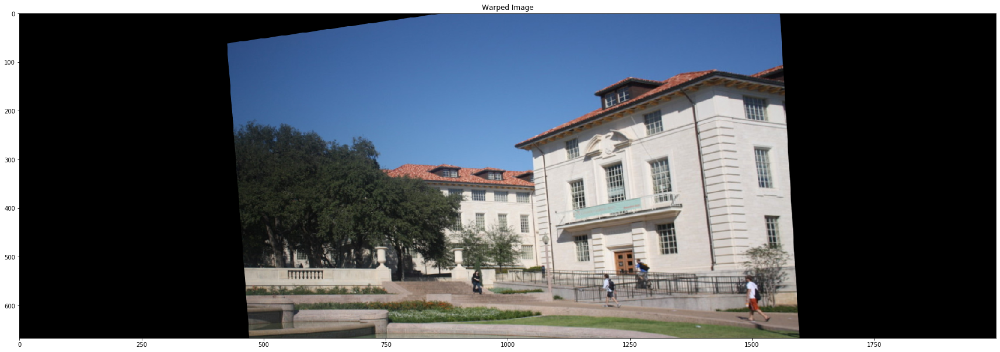

In [79]:
#We can now proceed to warp and display the right-side image in an orientation suitable to be stitched with the left image. This is also known as image registration.
dst = cv2.warpPerspective(img_right,H,(img_left.shape[1] + img_right.shape[1], img_left.shape[0]))

#Visualize the output image dst.
plt.figure(figsize=(30,20))
plt.title('Warped Image') 
plt.imshow(fixColor(dst))
                              

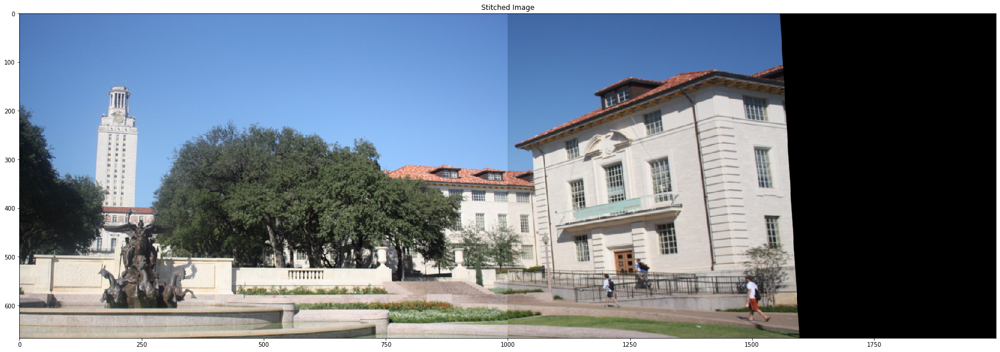

In [84]:
#We are placing the left image on the dst whose shape is left-image width plus right-mage width.
dst[0:img_left.shape[0], 0:img_left.shape[1]] = img_left

#Now let us store the resultant stitched image 
cv2.imwrite('resultant_stitched_panorama.jpg',dst)

#Let us display the stitched image using plt.imshow.
plt.figure(figsize=(30,20))
plt.title('Stitched Image')
plt.imshow(fixColor(dst))